In [1]:
import os
import pandas as pd
import numpy as np
import requests
import time
from bs4 import BeautifulSoup

from geopy.geocoders import Nominatim # module to convert an address into latitude and longitude values
# ! pip install geocoder
import geocoder # import geocoder

# libraries for displaying images
from IPython.display import Image 
from IPython.core.display import HTML 
    
# tranforming json file into a pandas dataframe library
from pandas import json_normalize

# !pip install git+https://github.com/sknzl/folium@update-css-url-to-https
# ! pip install folium
import folium # plotting library
from folium.plugins import MarkerCluster

In [2]:
# pd.set_option('display.max_rows', None) # show all rows

In [3]:
import base64

def _repr_html_(self, **kwargs):
    html = base64.b64encode(self.render(**kwargs).encode('utf8')).decode('utf8')
    onload = (
        'this.contentDocument.open();'
        'this.contentDocument.write(atob(this.getAttribute(\'data-html\')));'
        'this.contentDocument.close();'
    )
    if self.height is None:
        iframe = (
            '<div style="width:{width};">'
            '<div style="position:relative;width:100%;height:0;padding-bottom:{ratio};">'
            '<iframe src="about:blank" style="position:absolute;width:100%;height:100%;left:0;top:0;'
            'border:none !important;" '
            'data-html={html} onload="{onload}" '
            'allowfullscreen webkitallowfullscreen mozallowfullscreen>'
            '</iframe>'
            '</div></div>').format
        iframe = iframe(html=html, onload=onload, width=self.width, ratio=self.ratio)
    else:
        iframe = ('<iframe src="about:blank" width="{width}" height="{height}"'
                  'style="border:none !important;" '
                  'data-html={html} onload="{onload}" '
                  '"allowfullscreen" "webkitallowfullscreen" "mozallowfullscreen">'
                  '</iframe>').format
        iframe = iframe(html=html, onload=onload, width=self.width, height=self.height)
    return iframe

folium.branca.element.Figure._repr_html_ = _repr_html_

In [4]:
# ! cat NewKey.pem.pub

In [70]:
### Because it takes too much time to explore the data, we store the data in the CSV file for the next use.

In [6]:
subzone_df = pd.read_csv('csv\subzone_df.csv')
subzone_density = pd.read_csv('csv\subzone_density.csv')

In [7]:
subzone_density_json = pd.merge(subzone_density,subzone_df)
subzone_density_json = subzone_density_json.loc[:,['Subzone','Population_Density','Latitude','Longitude','url','json']]
subzone_density_json.to_csv('csv\subzone_density_json.csv',index=False)

In [8]:
subzone_density_json = pd.read_csv('csv\subzone_density_json.csv')
subzone_density_json

,Subzone,Population_Density,Latitude,Longitude,url,json
0,Ang Mo Kio Town Centre,15178.2897,1.371285,103.846994,https://api.foursquare.com/v2/venues/explore?&...,"[{'reasons': {'count': 0, 'items': [{'summary'..."
1,Cheng San,29411.1484,1.357107,103.819499,https://api.foursquare.com/v2/venues/explore?&...,"[{'reasons': {'count': 0, 'items': [{'summary'..."
2,Chong Boon,24568.8856,1.368207,103.856360,https://api.foursquare.com/v2/venues/explore?&...,"[{'reasons': {'count': 0, 'items': [{'summary'..."
3,Kebun Bahru,21616.9725,1.488346,103.750700,https://api.foursquare.com/v2/venues/explore?&...,"[{'reasons': {'count': 0, 'items': [{'summary'..."
4,Sembawang Hills,7657.9094,1.372399,103.829029,https://api.foursquare.com/v2/venues/explore?&...,"[{'reasons': {'count': 0, 'items': [{'summary'..."
...,...,...,...,...,...,...
275,Springleaf,1972.8229,1.398315,103.818057,https://api.foursquare.com/v2/venues/explore?&...,"[{'reasons': {'count': 0, 'items': [{'summary'..."
276,Yishun Central,6003.6664,1.426451,103.837204,https://api.foursquare.com/v2/venues/explore?&...,"[{'reasons': {'count': 0, 'items': [{'summary'..."
277,Yishun East,28984.3302,1.429384,103.835028,https://api.foursquare.com/v2/venues/explore?&...,"[{'reasons': {'count': 0, 'items': [{'summary'..."
278,Yishun South,31517.6839,1.429384,103.835028,https://api.foursquare.com/v2/venues/explore?&...,"[{'reasons': {'count': 0, 'items': [{'summary'..."


In [9]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

subzone_density_json['Restaurant_Number']=''
venues_map = folium.Map(location=[1.371285,103.846994], control_scale=True, zoom_start=10) # generate map centred around Ang Mo Kio Town Centre
for index,row in subzone_density_json.iterrows():
    subzone_name = row['Subzone']
    latitude = row['Latitude']
    longitude = row['Longitude']
    folium.CircleMarker(
        [latitude, longitude],
        radius=10,
        color='red',
        popup=subzone_name,
        fill = True,
        fill_color = 'red',
        fill_opacity = 0.4
    ).add_to(venues_map)
    venues = eval(row['json'])  # str convert to list
#     print(type(venues))
    #  Clean the json and structure it into a pandas dataframe.
    nearby_venues = json_normalize(venues) # flatten JSON
    if venues == [] :
        subzone_density_json.at[index,'Restaurant_Number'] = 0
        continue
    # filter columns
    filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
    nearby_venues =nearby_venues.loc[:, filtered_columns]

    # filter the category for each row
    nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

    # clean columns
    nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]
    subzone_density_json.at[index,'Restaurant_Number'] = nearby_venues.shape[0]
    
    # create a mark cluster object
    marker_cluster = MarkerCluster().add_to(venues_map)
    # add the restaurants to the mask cluster
    for lat, lng, label in zip(nearby_venues.lat, nearby_venues.lng, nearby_venues.categories):
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            color='blue',
            popup=label,
            fill = True,
            fill_color='blue',
            fill_opacity=0.4,            
        ).add_to(marker_cluster)

In [10]:
subzone_density_json

,Subzone,Population_Density,Latitude,Longitude,url,json,Restaurant_Number
0,Ang Mo Kio Town Centre,15178.2897,1.371285,103.846994,https://api.foursquare.com/v2/venues/explore?&...,"[{'reasons': {'count': 0, 'items': [{'summary'...",23
1,Cheng San,29411.1484,1.357107,103.819499,https://api.foursquare.com/v2/venues/explore?&...,"[{'reasons': {'count': 0, 'items': [{'summary'...",1
2,Chong Boon,24568.8856,1.368207,103.856360,https://api.foursquare.com/v2/venues/explore?&...,"[{'reasons': {'count': 0, 'items': [{'summary'...",11
3,Kebun Bahru,21616.9725,1.488346,103.750700,https://api.foursquare.com/v2/venues/explore?&...,"[{'reasons': {'count': 0, 'items': [{'summary'...",4
4,Sembawang Hills,7657.9094,1.372399,103.829029,https://api.foursquare.com/v2/venues/explore?&...,"[{'reasons': {'count': 0, 'items': [{'summary'...",9
...,...,...,...,...,...,...,...
275,Springleaf,1972.8229,1.398315,103.818057,https://api.foursquare.com/v2/venues/explore?&...,"[{'reasons': {'count': 0, 'items': [{'summary'...",6
276,Yishun Central,6003.6664,1.426451,103.837204,https://api.foursquare.com/v2/venues/explore?&...,"[{'reasons': {'count': 0, 'items': [{'summary'...",34
277,Yishun East,28984.3302,1.429384,103.835028,https://api.foursquare.com/v2/venues/explore?&...,"[{'reasons': {'count': 0, 'items': [{'summary'...",33
278,Yishun South,31517.6839,1.429384,103.835028,https://api.foursquare.com/v2/venues/explore?&...,"[{'reasons': {'count': 0, 'items': [{'summary'...",33


In [11]:
subzone_chinese_restaurant = subzone_density_json.loc[:,['Subzone','Population_Density','Latitude','Longitude','json','Restaurant_Number']]
subzone_chinese_restaurant.to_csv('csv\subzone_chinese_restaurant.csv',index=False)


In [12]:
subzone_chinese_restaurant = pd.read_csv('csv\subzone_chinese_restaurant.csv')
subzone_chinese_restaurant

,Subzone,Population_Density,Latitude,Longitude,json,Restaurant_Number
0,Ang Mo Kio Town Centre,15178.2897,1.371285,103.846994,"[{'reasons': {'count': 0, 'items': [{'summary'...",23
1,Cheng San,29411.1484,1.357107,103.819499,"[{'reasons': {'count': 0, 'items': [{'summary'...",1
2,Chong Boon,24568.8856,1.368207,103.856360,"[{'reasons': {'count': 0, 'items': [{'summary'...",11
3,Kebun Bahru,21616.9725,1.488346,103.750700,"[{'reasons': {'count': 0, 'items': [{'summary'...",4
4,Sembawang Hills,7657.9094,1.372399,103.829029,"[{'reasons': {'count': 0, 'items': [{'summary'...",9
...,...,...,...,...,...,...
275,Springleaf,1972.8229,1.398315,103.818057,"[{'reasons': {'count': 0, 'items': [{'summary'...",6
276,Yishun Central,6003.6664,1.426451,103.837204,"[{'reasons': {'count': 0, 'items': [{'summary'...",34
277,Yishun East,28984.3302,1.429384,103.835028,"[{'reasons': {'count': 0, 'items': [{'summary'...",33
278,Yishun South,31517.6839,1.429384,103.835028,"[{'reasons': {'count': 0, 'items': [{'summary'...",33


In [13]:
# venues_map.save('venues_map.html')

In [14]:
venues_map

In [15]:
# import matplotlib.pyplot as plt
# area = (400, 400, 800, 800)
# cropped_img = img.crop(area)
# cropped_img.save(venues_map+'/'+ "new")

From the map above,when we zoom out of the map, we can see that many subzone are no longer in Singapore, so we refine the data again and remove the points that are not in Singapore.

In [16]:
# winnow the abnormal subzone and the population density less than 10000 out
subzone_chinese_restaurant_winnow=subzone_chinese_restaurant[(subzone_chinese_restaurant['Latitude'].astype(float)<2)&(subzone_chinese_restaurant['Latitude'].astype(float)>0)&(subzone_chinese_restaurant['Population_Density'].astype(float)>10000)]

subzone_chinese_restaurant_winnow.to_csv('csv\subzone_chinese_restaurant_winnow.csv',index=False)
# subzone_chinese_restaurant_winnow

In [17]:
subzone_chinese_restaurant_winnow = pd.read_csv('csv\subzone_chinese_restaurant_winnow.csv')

In [18]:
subzone_chinese_restaurant_winnow

,Subzone,Population_Density,Latitude,Longitude,json,Restaurant_Number
0,Ang Mo Kio Town Centre,15178.2897,1.371285,103.846994,"[{'reasons': {'count': 0, 'items': [{'summary'...",23
1,Cheng San,29411.1484,1.357107,103.819499,"[{'reasons': {'count': 0, 'items': [{'summary'...",1
2,Chong Boon,24568.8856,1.368207,103.856360,"[{'reasons': {'count': 0, 'items': [{'summary'...",11
3,Kebun Bahru,21616.9725,1.488346,103.750700,"[{'reasons': {'count': 0, 'items': [{'summary'...",4
4,Shangri-La,23201.0467,1.311247,103.826757,"[{'reasons': {'count': 0, 'items': [{'summary'...",7
...,...,...,...,...,...,...
120,Woodlands West,20578.9538,1.436897,103.786216,"[{'reasons': {'count': 0, 'items': [{'summary'...",17
121,Northland,18371.4979,1.435710,103.840719,"[{'reasons': {'count': 0, 'items': [{'summary'...",16
122,Yishun East,28984.3302,1.429384,103.835028,"[{'reasons': {'count': 0, 'items': [{'summary'...",33
123,Yishun South,31517.6839,1.429384,103.835028,"[{'reasons': {'count': 0, 'items': [{'summary'...",33


Let's draw the map again.

In [19]:
venues_map_new = folium.Map(location=[1.371285,103.846994], control_scale=True, zoom_start=12) # generate map centred around Ang Mo Kio Town Centre
for index,row in subzone_chinese_restaurant_winnow.iterrows():
    subzone_name = row['Subzone']
    latitude = row['Latitude']
    longitude = row['Longitude']
    folium.CircleMarker(
        [latitude, longitude],
        radius=10,
        color='red',
        popup=subzone_name,
        fill = True,
        fill_color = 'red',
        fill_opacity = 0.4
    ).add_to(venues_map_new)
    venues = eval(row['json'])  # str convert to list
#     print(type(venues))
    #  Clean the json and structure it into a pandas dataframe.
    nearby_venues = json_normalize(venues) # flatten JSON
    if venues == [] :
        subzone_density_json.at[index,'Restaurant_Number'] = 0
        continue
    # filter columns
    filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
    nearby_venues =nearby_venues.loc[:, filtered_columns]

    # filter the category for each row
    nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

    # clean columns
    nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

    # create a mark cluster object
    marker_cluster = MarkerCluster().add_to(venues_map_new)
    # add the restaurants to the mask cluster
    for lat, lng, label in zip(nearby_venues.lat, nearby_venues.lng, nearby_venues.categories):
        folium.CircleMarker(
            [lat, lng],
            radius=5,
            color='blue',
            popup=label,
            fill = True,
            fill_color='blue',
            fill_opacity=0.4,            
        ).add_to(marker_cluster)
venues_map_new

In [20]:
# venues_map_new.save('venues_map_new.html')

# K-means

In [21]:
subzone_chinese_restaurant_winnow = pd.read_csv('csv\subzone_chinese_restaurant_winnow.csv')
subzone_chinese_restaurant_winnow_ML = subzone_chinese_restaurant_winnow[['Subzone','Population_Density','Restaurant_Number']]

# Weaken the influence of population density on K-means method
subzone_chinese_restaurant_winnow_ML['Population_Density']=subzone_chinese_restaurant_winnow_ML['Population_Density'].astype(int)/10000
subzone_chinese_restaurant_winnow_ML

c:\program files (x86)\microsoft visual studio\shared\python37_64\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,Subzone,Population_Density,Restaurant_Number
0,Ang Mo Kio Town Centre,1.5178,23
1,Cheng San,2.9411,1
2,Chong Boon,2.4568,11
3,Kebun Bahru,2.1616,4
4,Shangri-La,2.3201,7
...,...,...,...
120,Woodlands West,2.0578,17
121,Northland,1.8371,16
122,Yishun East,2.8984,33
123,Yishun South,3.1517,33


In [22]:
# we are using the inline backend
%matplotlib inline 

import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans 

X = subzone_chinese_restaurant_winnow_ML.values[:,1:]
X = np.nan_to_num(X)
clusterNum = 6
k_means = KMeans(init = "k-means++", n_clusters = clusterNum, n_init = 12)
k_means.fit(X)
labels = k_means.labels_
# centroids = labels.cluster_centers_
print(labels)

[0 1 5 1 5 5 5 1 1 1 5 4 0 5 3 5 4 5 1 1 5 3 1 3 4 1 4 1 1 1 3 3 1 1 4 1 5
 5 5 1 1 1 0 0 0 1 3 0 1 4 4 4 1 3 1 1 1 5 1 1 0 1 1 4 4 3 1 4 3 1 3 0 2 2
 2 1 5 5 5 1 1 5 1 4 0 0 4 5 4 3 4 2 1 5 5 5 1 5 1 1 5 3 4 5 1 4 1 1 0 0 5
 5 0 4 3 4 5 1 4 1 4 4 3 3 3]


In [23]:
subzone_chinese_restaurant_winnow_ML['Clus_km'] = labels
subzone_chinese_restaurant_winnow_ML.groupby('Clus_km').mean()
subzone_chinese_restaurant_winnow_ML

c:\program files (x86)\microsoft visual studio\shared\python37_64\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,Subzone,Population_Density,Restaurant_Number,Clus_km
0,Ang Mo Kio Town Centre,1.5178,23,0
1,Cheng San,2.9411,1,1
2,Chong Boon,2.4568,11,5
3,Kebun Bahru,2.1616,4,1
4,Shangri-La,2.3201,7,5
...,...,...,...,...
120,Woodlands West,2.0578,17,4
121,Northland,1.8371,16,4
122,Yishun East,2.8984,33,3
123,Yishun South,3.1517,33,3


c:\program files (x86)\microsoft visual studio\shared\python37_64\lib\site-packages\ipykernel_launcher.py:6: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  


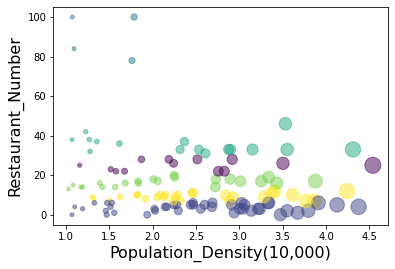

In [24]:
x1 = X[:, 0] # Population_Density
y1 = X[:, 1] # Restaurant_Numbe
x1 = np.array(x1, dtype=np.float64) # Error:'float' object has no attribute 'sqrt' without execute # can use np.float32 as well

area = np.pi * (x1*2)**2  
plt.scatter(x1, y1, s=area, c=labels.astype(np.float), alpha=0.5)
plt.xlabel('Population_Density(10,000)', fontsize=16)
plt.ylabel('Restaurant_Number', fontsize=16)
plt.savefig('image\scatter.png')
plt.show()

From tha scatter above, we can see that the number of restaurants has no obvious relationship with population density.

## Bar plot

In [25]:
subzone_chinese_restaurant_winnow_ML.set_index(['Subzone'], inplace=True)
subzone_chinese_restaurant_winnow_ML

,Population_Density,Restaurant_Number,Clus_km
Subzone,,,
Ang Mo Kio Town Centre,1.5178,23,0
Cheng San,2.9411,1,1
Chong Boon,2.4568,11,5
Kebun Bahru,2.1616,4,1
Shangri-La,2.3201,7,5
...,...,...,...
Woodlands West,2.0578,17,4
Northland,1.8371,16,4
Yishun East,2.8984,33,3


In [26]:
subzone_chinese_restaurant_winnow_sort_PD = subzone_chinese_restaurant_winnow_ML.sort_values(by='Population_Density', ascending=True)
plot_subzone_PD = subzone_chinese_restaurant_winnow_sort_PD['Population_Density']
plot_subzone_PD

Subzone
Kampong Java            1.0303
Bedok Reservoir         1.0704
Farrer Park             1.0717
China Square            1.0751
Hougang Central         1.0835
                         ...  
Fajar                   4.1269
Sengkang Town Centre    4.2417
Tiong Bahru Station     4.3101
Yew Tee                 4.3750
Jurong West Central     4.5396
Name: Population_Density, Length: 125, dtype: float64

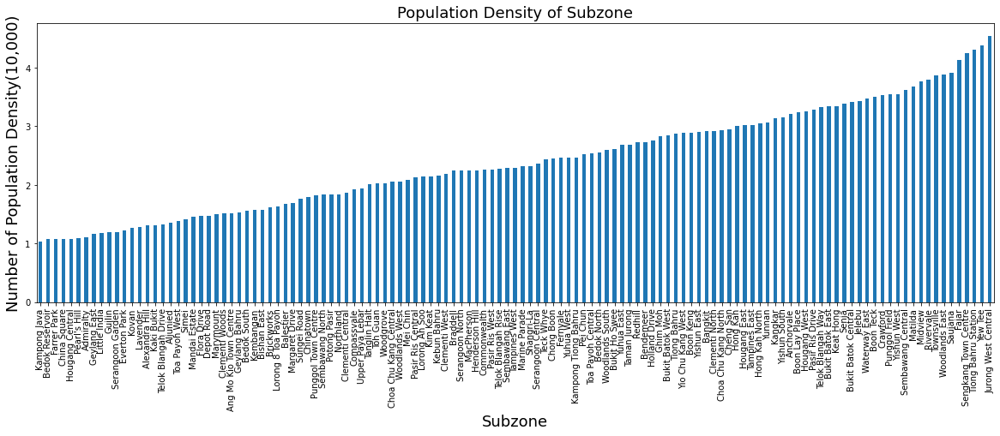

In [27]:
plot_subzone_PD.plot(kind='bar', figsize=(20, 6))

plt.xlabel('Subzone',fontsize=18) # add to x-label to the plot
plt.ylabel('Number of Population Density(10,000)',fontsize=18) # add y-label to the plot
plt.title('Population Density of Subzone',fontsize=18) # add title to the plot
plt.savefig('image\\bar_population_density.png')
plt.show()

In [28]:
# # generate plot
# plot_subzone_PD.plot(kind='barh', figsize=(15, 12), color='steelblue')
# plt.xlabel('Number of Population Density')
# plt.title('Top 15 Population Density')

# # annotate value labels to each subzone
# for index, value in enumerate(plot_subzone_PD): 
#     label = format(int(value), ',') # format int with commas

# # place text at the end of bar (subtracting 47000 from x, and 0.1 from y to make it fit within the bar)
#     plt.annotate(label, xy=(value, index), color='white')
# #     print(index,label)
# plt.show()

In [29]:
subzone_chinese_restaurant_winnow_sort_RN = subzone_chinese_restaurant_winnow_ML.sort_values(by='Restaurant_Number', ascending=True)
plot_subzone_RN = subzone_chinese_restaurant_winnow_sort_RN['Restaurant_Number']
# plot_subzone_RN

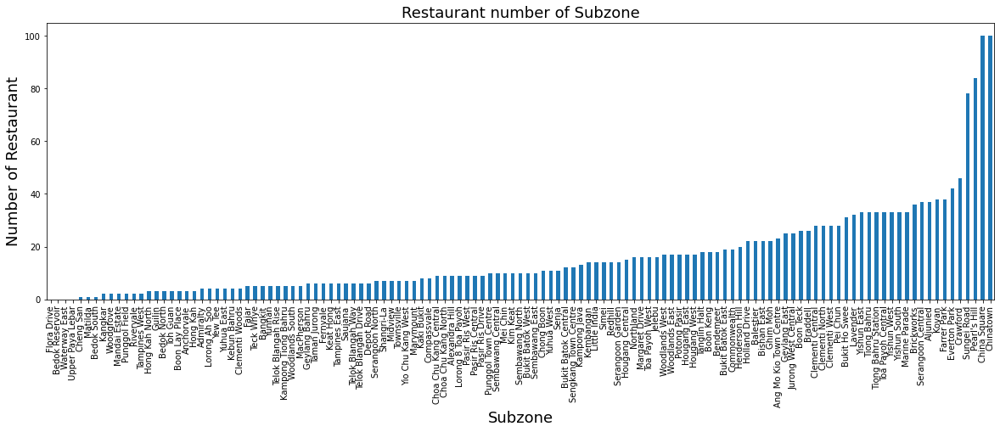

In [69]:
plot_subzone_RN.plot(kind='bar', figsize=(20, 6))

plt.xlabel('Subzone',fontsize=18) # add to x-label to the plot
plt.ylabel('Number of Restaurant',fontsize=18) # add y-label to the plot
plt.title('Restaurant number of Subzone',fontsize=18) # add title to the plot
plt.savefig('image\\bar_restaurant_number.png')
plt.show()

## Machine Learning and Explore
From the above data, we can see that there are many subzones with a population density is more than 10000/km2, and the number of Chinese restaurants in several subzones is significantly higher than other subzones. Therefore, when we explore these data through machine learning, we will exclude these subzones from the selected data set, and choose the most suitable investment area from the subzone with 0 restaurants.

In [31]:
from sklearn import preprocessing
from sklearn.metrics import f1_score

In [32]:
# Reduce the impact of outliers
subzone_chinese_restaurant_winnow_ML = subzone_chinese_restaurant_winnow_ML[(subzone_chinese_restaurant_winnow_ML['Restaurant_Number']<50)]
# subzone_chinese_restaurant_winnow_ML

In [33]:
# subzone_chinese_restaurant_winnow['Population_Density_around'] = (np.around(subzone_chinese_restaurant_winnow['Population_Density'].div(1000,axis=0),))*1000
subzone_chinese_restaurant_winnow_ML.loc[:,'Population_Density_around'] = np.around(subzone_chinese_restaurant_winnow_ML.loc[:,'Population_Density'],decimals=1)*10000
# subzone_chinese_restaurant_winnow_ML

C:\Users\Li_Congwei\AppData\Roaming\Python\Python37\site-packages\pandas\core\indexing.py:1597: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
C:\Users\Li_Congwei\AppData\Roaming\Python\Python37\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


In [34]:
subzone_chinese_restaurant_winnow_ML.loc[:,"Population_Density_range"] = pd.cut(x=subzone_chinese_restaurant_winnow_ML.loc[:,"Population_Density_around"],bins=[10000, 15000, 20000, 25000, 30000, 35000, 40000,50000],labels=[10000, 15000, 20000, 25000, 30000, 35000, 40000],right=False)
subzone_chinese_restaurant_winnow_ML.loc[:,"Restaurant_Number_range"] = pd.cut(x=subzone_chinese_restaurant_winnow_ML.loc[:,"Restaurant_Number"],bins=[0,3,10,15,20,25,30,35,40,50],labels=[0,5,10,15,20,25,30,35,40],right=False)

# subzone_chinese_restaurant_winnow_ML

In [35]:
subzone_chinese_restaurant_winnow_ML_new = subzone_chinese_restaurant_winnow_ML[(subzone_chinese_restaurant_winnow_ML['Restaurant_Number_range']>0)]
# subzone_chinese_restaurant_winnow_ML_new

In [36]:
X = subzone_chinese_restaurant_winnow_ML_new[['Population_Density_range']].values
y = subzone_chinese_restaurant_winnow_ML_new['Restaurant_Number_range']

In [37]:
# subzones with zero number of Chinese restaurants
subzone_chinese_restaurant_winnow_ML_0 = subzone_chinese_restaurant_winnow_ML[(subzone_chinese_restaurant_winnow_ML['Restaurant_Number_range']==0)]
# subzone_chinese_restaurant_winnow_ML_0

In [38]:
X_pre = subzone_chinese_restaurant_winnow_ML_0[['Population_Density_range']].values
y_pre = subzone_chinese_restaurant_winnow_ML_0['Restaurant_Number_range']
y_pre = y_pre.reset_index()

## Seting up train/test set
We will be using <b>train/test split</b> on our data. 

In [39]:
from sklearn.model_selection import train_test_split

In [40]:
X_train, X_test, y_train, y_test = train_test_split( X, y, test_size=0.3, random_state=4)

In [41]:
print('Shape of X training set {}'.format(X_train.shape),'&',' Size of Y training set {}'.format(y_train.shape))
print('Shape of X training set {}'.format(X_test.shape),'&',' Size of Y training set {}'.format(y_test.shape))


Shape of X training set (75, 1) &  Size of Y training set (75,)
Shape of X training set (33, 1) &  Size of Y training set (33,)


##  Decision Tree

In [42]:
from sklearn.tree import DecisionTreeClassifier
DT_model = DecisionTreeClassifier(criterion="entropy", max_depth = 3)
DT_model.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=3)

In [43]:
DT_yhat = DT_model.predict(X_test)

In [44]:
print (DT_yhat [0:5])
print (y_test [0:5])

[5 5 5 5 5]
Subzone
Crawford             40
Hong Kah North        5
Telok Blangah Way     5
Woodlands West       15
Kebun Bahru           5
Name: Restaurant_Number_range, dtype: category
Categories (9, int64): [0 < 5 < 10 < 15 ... 25 < 30 < 35 < 40]


In [45]:
print("DT F1-score: %.2f" % f1_score(y_test, DT_yhat, average='weighted') )

DT F1-score: 0.24


In [46]:
from sklearn import metrics
print("Train set Accuracy: ", metrics.accuracy_score(y_train, DT_model.predict(X_train)))
print("Test set Accuracy: ", metrics.accuracy_score(y_test, DT_yhat))

Train set Accuracy:  0.41333333333333333
Test set Accuracy:  0.3333333333333333


In [47]:
predDT=DT_model.predict(X_pre)
print(predDT)
print(y_pre)

[ 5  5 20  5 20 20  5  5  5  5 20  5  5]
             Subzone Restaurant_Number_range
0          Cheng San                       0
1    Bedok Reservoir                       0
2        Bedok South                       0
3            Kangkar                       0
4      Mandai Estate                       0
5        Flora Drive                       0
6            Matilda                       0
7      Punggol Field                       0
8      Waterway East                       0
9          Rivervale                       0
10  Upper Paya Lebar                       0
11     Tampines West                       0
12         Woodgrove                       0


In [48]:
predDT_pd = pd.DataFrame(predDT,columns=['predNumber'])
predCompare = pd.concat([y_pre,predDT_pd],axis=1)
predCompare

,Subzone,Restaurant_Number_range,predNumber
0,Cheng San,0,5
1,Bedok Reservoir,0,5
2,Bedok South,0,20
3,Kangkar,0,5
4,Mandai Estate,0,20
5,Flora Drive,0,20
6,Matilda,0,5
7,Punggol Field,0,5
8,Waterway East,0,5
9,Rivervale,0,5


In [49]:
predCompare = predCompare[(predCompare['predNumber']==20)]
predCompare['Subzone']

2          Bedok South
4        Mandai Estate
5          Flora Drive
10    Upper Paya Lebar
Name: Subzone, dtype: object

In [50]:
merge_predCompare = pd.merge(subzone_chinese_restaurant_winnow,predCompare)
merge_predCompare

,Subzone,Population_Density,Latitude,Longitude,json,Restaurant_Number,Restaurant_Number_range,predNumber
0,Bedok South,15576.8333,1.317294,103.949681,"[{'reasons': {'count': 0, 'items': [{'summary'...",1,0,20
1,Mandai Estate,14605.1712,1.408096,103.758327,"[{'reasons': {'count': 0, 'items': [{'summary'...",2,0,20
2,Flora Drive,14702.0531,1.359808,103.965005,[],0,0,20
3,Upper Paya Lebar,19374.7853,1.361109,103.925461,[],0,0,20


In [51]:
for index,row in merge_predCompare.iterrows():
    subzone_name = row['Subzone']
    latitude = row['Latitude']
    longitude = row['Longitude']
    folium.CircleMarker(
        [latitude, longitude],
        radius=10,
        color='cyan',
        popup=subzone_name,
        fill = True,
        fill_color = 'cyan',
        fill_opacity = 1
    ).add_to(venues_map_new)

venues_map_new

# K Nearest Neighbor(KNN)

In [52]:
from sklearn.neighbors import KNeighborsClassifier
k = 4
#Train Model and Predict  
KNN_model = KNeighborsClassifier(n_neighbors = k).fit(X_train,y_train)
KNN_yhat = KNN_model.predict(X_test)
print (KNN_yhat [0:5])
print (y_test [0:5])

[5 5 5 5 5]
Subzone
Crawford             40
Hong Kah North        5
Telok Blangah Way     5
Woodlands West       15
Kebun Bahru           5
Name: Restaurant_Number_range, dtype: category
Categories (9, int64): [0 < 5 < 10 < 15 ... 25 < 30 < 35 < 40]


In [53]:
print("KNN F1-score: %.2f" % f1_score(y_test, KNN_yhat, average='weighted') )

KNN F1-score: 0.28


In [54]:
print("Train set Accuracy: ", metrics.accuracy_score(y_train, KNN_model.predict(X_train)))
print("Test set Accuracy: ", metrics.accuracy_score(y_test, KNN_yhat))

Train set Accuracy:  0.4
Test set Accuracy:  0.45454545454545453


In [55]:
predKNN=KNN_model.predict(X_pre)
print(predKNN)
print(y_pre)

[5 5 5 5 5 5 5 5 5 5 5 5 5]
             Subzone Restaurant_Number_range
0          Cheng San                       0
1    Bedok Reservoir                       0
2        Bedok South                       0
3            Kangkar                       0
4      Mandai Estate                       0
5        Flora Drive                       0
6            Matilda                       0
7      Punggol Field                       0
8      Waterway East                       0
9          Rivervale                       0
10  Upper Paya Lebar                       0
11     Tampines West                       0
12         Woodgrove                       0


In [56]:
predKNN_pd = pd.DataFrame(predKNN,columns=['predNumber'])
predCompare = pd.concat([y_pre,predKNN_pd],axis=1)
predCompare

,Subzone,Restaurant_Number_range,predNumber
0,Cheng San,0,5
1,Bedok Reservoir,0,5
2,Bedok South,0,5
3,Kangkar,0,5
4,Mandai Estate,0,5
5,Flora Drive,0,5
6,Matilda,0,5
7,Punggol Field,0,5
8,Waterway East,0,5
9,Rivervale,0,5


## Support Vector Machine(SVM)

In [57]:
from sklearn import svm
SVM_model = svm.SVC()
SVM_model.fit(X_train, y_train) 

SVC()

In [58]:
SVM_yhat = SVM_model.predict(X_test)
print (SVM_yhat [0:5])
print (y_test [0:5])

[5 5 5 5 5]
Subzone
Crawford             40
Hong Kah North        5
Telok Blangah Way     5
Woodlands West       15
Kebun Bahru           5
Name: Restaurant_Number_range, dtype: category
Categories (9, int64): [0 < 5 < 10 < 15 ... 25 < 30 < 35 < 40]


In [59]:
print("SVM F1-score: %.2f" % f1_score(y_test, SVM_yhat, average='weighted') )

SVM F1-score: 0.28


In [60]:
print("Train set Accuracy: ", metrics.accuracy_score(y_train, SVM_model.predict(X_train)))
print("Test set Accuracy: ", metrics.accuracy_score(y_test, SVM_yhat))

Train set Accuracy:  0.4
Test set Accuracy:  0.45454545454545453


In [61]:
predSVM = SVM_model.predict(X_pre)
print(predSVM)
print(y_pre)

[5 5 5 5 5 5 5 5 5 5 5 5 5]
             Subzone Restaurant_Number_range
0          Cheng San                       0
1    Bedok Reservoir                       0
2        Bedok South                       0
3            Kangkar                       0
4      Mandai Estate                       0
5        Flora Drive                       0
6            Matilda                       0
7      Punggol Field                       0
8      Waterway East                       0
9          Rivervale                       0
10  Upper Paya Lebar                       0
11     Tampines West                       0
12         Woodgrove                       0


In [62]:
predSVM_pd = pd.DataFrame(predSVM,columns=['predNumber'])
predCompare = pd.concat([y_pre,predSVM_pd],axis=1)
predCompare

,Subzone,Restaurant_Number_range,predNumber
0,Cheng San,0,5
1,Bedok Reservoir,0,5
2,Bedok South,0,5
3,Kangkar,0,5
4,Mandai Estate,0,5
5,Flora Drive,0,5
6,Matilda,0,5
7,Punggol Field,0,5
8,Waterway East,0,5
9,Rivervale,0,5


## Logistic Regression

In [63]:
from sklearn.linear_model import LogisticRegression
LR_model = LogisticRegression(C=0.01).fit(X_train,y_train)
LR_model

LogisticRegression(C=0.01)

In [64]:
LR_yhat = LR_model.predict(X_test)
LR_yhat_prob = LR_model.predict_proba(X_test)
print (LR_yhat [0:5])
print (y_test [0:5])

[5 5 5 5 5]
Subzone
Crawford             40
Hong Kah North        5
Telok Blangah Way     5
Woodlands West       15
Kebun Bahru           5
Name: Restaurant_Number_range, dtype: category
Categories (9, int64): [0 < 5 < 10 < 15 ... 25 < 30 < 35 < 40]


In [65]:
print("Train set Accuracy: ", metrics.accuracy_score(y_train, LR_model.predict(X_train)))
print("Test set Accuracy: ", metrics.accuracy_score(y_test, LR_yhat))

Train set Accuracy:  0.4
Test set Accuracy:  0.45454545454545453


In [66]:
print("LR F1-score: %.2f" % f1_score(y_test, LR_yhat, average='weighted') )

LR F1-score: 0.28


In [67]:
predLR = LR_model.predict(X_pre)
predLR_prob = LR_model.predict_proba(X_pre)
print(predLR)
print(y_pre)

[5 5 5 5 5 5 5 5 5 5 5 5 5]
             Subzone Restaurant_Number_range
0          Cheng San                       0
1    Bedok Reservoir                       0
2        Bedok South                       0
3            Kangkar                       0
4      Mandai Estate                       0
5        Flora Drive                       0
6            Matilda                       0
7      Punggol Field                       0
8      Waterway East                       0
9          Rivervale                       0
10  Upper Paya Lebar                       0
11     Tampines West                       0
12         Woodgrove                       0


In [68]:
predLR_pd = pd.DataFrame(predLR,columns=['predNumber'])
predCompare = pd.concat([y_pre,predLR_pd],axis=1)
predCompare

,Subzone,Restaurant_Number_range,predNumber
0,Cheng San,0,5
1,Bedok Reservoir,0,5
2,Bedok South,0,5
3,Kangkar,0,5
4,Mandai Estate,0,5
5,Flora Drive,0,5
6,Matilda,0,5
7,Punggol Field,0,5
8,Waterway East,0,5
9,Rivervale,0,5
